In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
from formating import bold, underline, strike, hr, percent, Percent, display, Markdown, Latex
from acquire import scrape_github_data



# UPDATE:
- The few lines directly below are the proof and the pudding. 

# ACQUIRE

In [2]:
my_data = scrape_github_data()

### Let's test the scrape_github_data() function to see what it gives us

[{'repo': 'jackfrued/Python-100-Days',
  'language': 'Python',
  'readme_contents': '## Python - 100天从新手到大师\n\n> **作者**：骆昊\n>\n> **说明**：从项目上线到获得8w+星标以来，一直收到反馈说基础部分（前15天的内容）对新手来说是比较困难的，建议有配套视频进行讲解。最近把基础部分的内容重新制作了一个名为[“Python-Core-50-Courses”](<https://github.com/jackfrued/Python-Core-50-Courses>)的项目，**用更为简单通俗的方式重写了这部分内容并附带了视频讲解**，初学者可以关注下这个新项目。如果需要**Python基础视频**，可以在“B站”搜索[《Python零基础快速上手》](https://www.bilibili.com/video/BV1FT4y1R7sz)，这套视频是我讲课的时候录制的随堂视频，画质尚可、音质一般，但是对初学者应该会有些帮助，欢迎大家留言、评论、发弹幕。学习之后觉得有收获的小伙伴可以“一键三连”来支持UP主（千锋Python）。国内用户如果访问GitHub比较慢的话，可以关注我的**知乎号[Python-Jack](https://www.zhihu.com/people/jackfrued)**，上面的[“从零开始学Python”](<https://zhuanlan.zhihu.com/c_1216656665569013760>)专栏比较适合初学者，其他的专栏也在持续创作和更新中，欢迎大家关注并点赞评论。\n>\n> 创作不易，感谢大家的打赏支持，这些钱不会用于个人消费（例如：购买咖啡），而是通过腾讯公益、美团公益、水滴筹等平台捐赠给需要帮助的人（[点击](./更新日志.md)了解捐赠情况）。需要加入QQ学习群的可以扫描下面的二维码，三个群加一个即可，不要重复进群。学习群会为大家提供**学习资源**和**问题解答**，如果有**Python体验课**和**行业公开课**会提前在群里通知大家，欢迎大家加入。\n>\n> 项目“Day80~90”部分目前仍在创作中，因为作者平时也挤不出太多时间来写文档，因此更新的速度比较缓慢，感谢大家的理解。\n
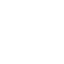
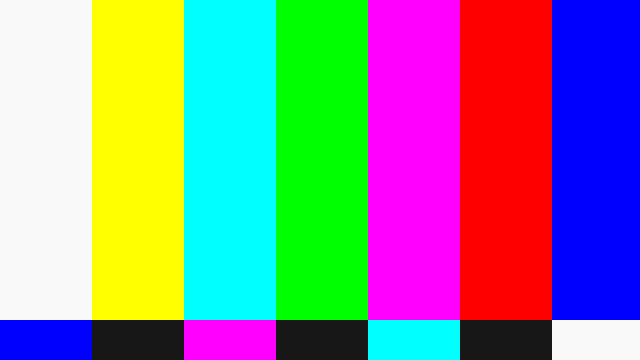

In [3]:
my_data

In [4]:
pd.to_pickle(my_data, 'repo_dicts')

In [5]:
pd.DataFrame(my_data)

,repo,language,readme_contents
0,jackfrued/Python-100-Days,Python,## Python - 100天从新手到大师\n\n> **作者**：骆昊\n>\n> **...
1,TheAlgorithms/Python,Python,"<div align=""center"">\n<!-- Title: -->\n <a hr..."
2,scikit-learn/scikit-learn,Python,.. -*- mode: rst -*-\n\n|Azure|_ |Travis|_ |Co...
3,ansible/ansible,Python,|PyPI version| |Docs badge| |Chat badge| |Buil...
4,vinta/awesome-python,Python,# Awesome Python [![Awesome](https://cdn.rawgi...
...,...,...,...
675,instillai/TensorFlow-Course,Jupyter Notebook,\n\n********************\n`TensorFlow Course`_...
676,fengdu78/lihang-code,Jupyter Notebook,# 《统计学习方法》第二版的代码实现\n\n李航老师编写的《统计学习方法》全面系统地介绍了统...
677,fchollet/deep-learning-with-python-notebooks,Jupyter Notebook,"# Companion Jupyter notebooks for the book ""De..."
678,fivethirtyeight/data,Jupyter Notebook,See https://data.fivethirtyeight.com/ for a li...


In [6]:
df = pd.DataFrame(my_data)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 680 entries, 0 to 679
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   repo             680 non-null    object
 1   language         679 non-null    object
 2   readme_contents  680 non-null    object
dtypes: object(3)
memory usage: 16.1+ KB


In [9]:
df.language.value_counts()

Python              149
C                   110
PHP                 110
C++                 110
HTML                100
JavaScript           20
Java                 20
C#                   20
TypeScript           20
Jupyter Notebook     20
Name: language, dtype: int64

In [10]:
len(df)

680

In [13]:
df.repo.nunique()

601

In [24]:
df.groupby('repo').agg({'language': 'first', 'readme_contents': 'first'})

,language,readme_contents
repo,,
0voice/interview_internal_reference,Python,\n## 2021年最新总结，阿里，腾讯，百度，美团，头条等技术面试题目，以及答案，专家出题...
2dust/v2rayN,C#,"# v2rayN\nA V2Ray client for Windows, support ..."
30-seconds/30-seconds-of-code,JavaScript,[![Logo](/logo.png)](https://30secondsofcode.o...
521xueweihan/HelloGitHub,Python,"<p align=""center"">\n <img src=""https://cdn.js..."
Airblader/i3,C,[![Build Status](https://github.com/Airblader/...
...,...,...
yuzu-emu/yuzu,C++,<!--\nSPDX-FileCopyrightText: 2018 yuzu Emulat...
zealdocs/zeal,C++,# Zeal\n\n[![Changelog](https://img.shields.io...
zergtant/pytorch-handbook,Jupyter Notebook,# PyTorch 中文手册（pytorch handbook）\r\n![pytorch]...


In [25]:
df = df.groupby('repo').agg({'language': 'first', 'readme_contents': 'first'})

In [26]:
df.groupby('language').agg({'readme_contents': 'sum'})

,readme_contents
language,
C,[![Build Status](https://github.com/Airblader/...
C#,"# v2rayN\nA V2Ray client for Windows, support ..."
C++,"<p align=""center"">\n <img src=""/images/wled_l..."
HTML,# Charts.css\n\n![GitHub Version](https://img....
Java,[![logo][logo]](https://github.com/Blankj/Andr...
JavaScript,[![Logo](/logo.png)](https://30secondsofcode.o...
Jupyter Notebook,# [Bayesian Methods for Hackers](http://camdav...
PHP,"<p align=""center""><img src=""https://demo.cache..."
Python,\n## 2021年最新总结，阿里，腾讯，百度，美团，头条等技术面试题目，以及答案，专家出题...


In [27]:
readmes_sum_by_language = df.groupby('language').agg({'readme_contents': 'sum'})

In [28]:
readmes_sum_by_language.loc['Python'].readme_contents

'\n## 2021年最新总结，阿里，腾讯，百度，美团，头条等技术面试题目，以及答案，专家出题人分析汇总。持续更新中。\n\n* [阿里篇](#1)\n* [华为篇](#2)\n* [百度篇](#3)\n* [腾讯篇](#4)\n* [美团篇](#5)\n* [头条篇](#6)\n* [滴滴篇](#7)\n* [京东篇](#8)\n* [MySQL篇](#9)\n* [Redis篇](#10)\n* [MongoDB篇](#11)\n* [Zookeeper篇](#12)\n* [Nginx篇](#13)\n* [算法篇](#14)\n* [内存篇](#15)\n* [cpu篇](#16)\n* [磁盘篇](#17)\n* [网络通信篇](#18)\n* [安全篇](#19)\n* [并发篇](#20)\n\n<h3 id="1">阿里篇</h3> \n\n---\n\n##### [1.1.1 如何实现一个高效的单向链表逆序输出？](01.阿里篇/1.1.1%20%E5%A6%82%E4%BD%95%E5%AE%9E%E7%8E%B0%E4%B8%80%E4%B8%AA%E9%AB%98%E6%95%88%E7%9A%84%E5%8D%95%E5%90%91%E9%93%BE%E8%A1%A8%E9%80%86%E5%BA%8F%E8%BE%93%E5%87%BA%EF%BC%9F.md)\n\n##### [1.1.2 已知sqrt(2)约等于1.414，要求不用数学库，求sqrt(2)精确到小数点后10位](01.阿里篇/1.1.2%20%E5%B7%B2%E7%9F%A5sqrt%282%29%E7%BA%A6%E7%AD%89%E4%BA%8E1.414%EF%BC%8C%E8%A6%81%E6%B1%82%E4%B8%8D%E7%94%A8%E6%95%B0%E5%AD%A6%E5%BA%93%EF%BC%8C%E6%B1%82sqrt%282%29%E7%B2%BE%E7%A1%AE%E5%88%B0%E5%B0%8F%E6%95%B0%E7%82%B9%E5%90%8E10%E4%BD%8D.md)\n\n##### [1.1.3 给定一个二叉搜索树(BST)，找到树中第 K 小的节点](01.阿里篇/1.1.3%20%E7%BB%99%E5%AE%

In [29]:
pd.to_pickle(readmes_sum_by_language, 'readmes_sum_groupby_language')

In [31]:
len(df)

601

In [32]:
pd.to_pickle(df, 'readmes_dataframe')

# BREAK: Back to where we started gathering our acquisition

In [7]:
url = 'https://github.com/trending/python?since=daily&spoken_language_code=en'

In [9]:
from env import github_token, github_username

In [10]:
headers = {"Authorization": f"token {github_token}", "User-Agent": github_username}

In [11]:
import requests

In [13]:
import os
import json
from typing import Dict, List, Optional, Union, cast

In [16]:
from bs4 import BeautifulSoup
# from requests import get
import re

In [14]:
def github_api_request(url: str) -> Union[List, Dict]:
    response = requests.get(url, headers=headers)
    response_data = response
    if response.status_code != 200:
        raise Exception(
            f"Error response from github api! status code: {response.status_code}, "
            f"response: {json.dumps(response_data)}"
        )
    return response_data

In [17]:
# github_api_request(url)

In [19]:
soup = BeautifulSoup(requests.get(url, headers=headers).content)

In [20]:
[each.text.strip() for each in soup.find_all('a')]

['Skip to content',
 '',
 'Sign\xa0up',
 'Actions\n        Automate any workflow',
 'Packages\n        Host and manage packages',
 'Security\n        Find and fix vulnerabilities',
 'Codespaces\n        Instant dev environments',
 'Copilot\n        Write better code with AI',
 'Code review\n        Manage code changes',
 'Issues\n        Plan and track work',
 'Discussions\n        Collaborate outside of code',
 'All features',
 'Documentation',
 'GitHub Skills',
 'Blog',
 'Enterprise',
 'Teams',
 'Compare all',
 'CI/CD & Automation',
 'DevOps',
 'DevSecOps',
 'Customer Stories',
 'Resources',
 'GitHub Sponsors\n        Fund open source developers',
 'The ReadME Project\n        GitHub community articles',
 'Topics',
 'Trending',
 'Collections',
 'Pricing',
 'Search\n      \n\n        All GitHub\n      \n↵\n\n\n      Jump to\n      ↵',
 'Search\n      \n\n        All GitHub\n      \n↵\n\n\n      Jump to\n      ↵',
 'Search\n      \n\n        All GitHub\n      \n↵\n\n\n      Jump to\n  

In [30]:
# soup.find_all('h1').a['href']

In [29]:
soup.select('h1')[1].a['href']

'/commaai/openpilot'

In [32]:
for i in range(1,26):
    print(soup.find_all('h1')[i].a['href'])

/commaai/openpilot
/starlite-api/starlite
/mindsdb/mindsdb
/donnemartin/system-design-primer
/geohot/tinygrad
/xinntao/Real-ESRGAN
/r0oth3x49/ghauri
/imvast/Discord-Account-Creator
/donnemartin/interactive-coding-challenges
/freqtrade/freqtrade
/WAMAWAMA/wama_medic
/KichangKim/DeepDanbooru
/ytdl-org/youtube-dl
/Textualize/rich
/JingShing/NovelAI-installation-tutorial
/matplotlib/matplotlib
/mingyuan-zhang/MotionDiffuse
/SilentNightSound/GI-Model-Importer
/geerlingguy/ansible-for-devops
/Textualize/textual
/Datalux/Osintgram
/TeamYukki/YukkiMusicBot
/WeAreMahsaAmini/FreeInternet
/carson-katri/dream-textures
/remyroy/ethstaker


In [33]:
repos = []

In [34]:
import pprint

In [36]:
for i in range(1,26):
    repo = soup.find_all('h1')[i].a['href']
    repos.append(repo)
    
print(repos)

['/commaai/openpilot', '/starlite-api/starlite', '/mindsdb/mindsdb', '/donnemartin/system-design-primer', '/geohot/tinygrad', '/xinntao/Real-ESRGAN', '/r0oth3x49/ghauri', '/imvast/Discord-Account-Creator', '/donnemartin/interactive-coding-challenges', '/freqtrade/freqtrade', '/WAMAWAMA/wama_medic', '/KichangKim/DeepDanbooru', '/ytdl-org/youtube-dl', '/Textualize/rich', '/JingShing/NovelAI-installation-tutorial', '/matplotlib/matplotlib', '/mingyuan-zhang/MotionDiffuse', '/SilentNightSound/GI-Model-Importer', '/geerlingguy/ansible-for-devops', '/Textualize/textual', '/Datalux/Osintgram', '/TeamYukki/YukkiMusicBot', '/WeAreMahsaAmini/FreeInternet', '/carson-katri/dream-textures', '/remyroy/ethstaker', '/commaai/openpilot', '/starlite-api/starlite', '/mindsdb/mindsdb', '/donnemartin/system-design-primer', '/geohot/tinygrad', '/xinntao/Real-ESRGAN', '/r0oth3x49/ghauri', '/imvast/Discord-Account-Creator', '/donnemartin/interactive-coding-challenges', '/freqtrade/freqtrade', '/WAMAWAMA/wama_

In [37]:
times = ['daily', 'weekly', 'monthly']

In [40]:
for j in times:
#     times is a list of strings for daily weekly and monthly for the url since=
    url = f'https://github.com/trending/python?since={j}&spoken_language_code=en'
    
    soup = BeautifulSoup(requests.get(url, headers=headers).content)
    
    for i in range(1,26):
        repo = soup.find_all('h1')[i].a['href']
        repos.append(repo)
    
print(repos)

['/commaai/openpilot', '/starlite-api/starlite', '/mindsdb/mindsdb', '/donnemartin/system-design-primer', '/geohot/tinygrad', '/xinntao/Real-ESRGAN', '/r0oth3x49/ghauri', '/imvast/Discord-Account-Creator', '/donnemartin/interactive-coding-challenges', '/freqtrade/freqtrade', '/WAMAWAMA/wama_medic', '/KichangKim/DeepDanbooru', '/ytdl-org/youtube-dl', '/Textualize/rich', '/JingShing/NovelAI-installation-tutorial', '/matplotlib/matplotlib', '/mingyuan-zhang/MotionDiffuse', '/SilentNightSound/GI-Model-Importer', '/geerlingguy/ansible-for-devops', '/Textualize/textual', '/Datalux/Osintgram', '/TeamYukki/YukkiMusicBot', '/WeAreMahsaAmini/FreeInternet', '/carson-katri/dream-textures', '/remyroy/ethstaker', '/commaai/openpilot', '/starlite-api/starlite', '/mindsdb/mindsdb', '/donnemartin/system-design-primer', '/geohot/tinygrad', '/xinntao/Real-ESRGAN', '/r0oth3x49/ghauri', '/imvast/Discord-Account-Creator', '/donnemartin/interactive-coding-challenges', '/freqtrade/freqtrade', '/WAMAWAMA/wama_

In [41]:
len(repos)

125

In [50]:
len(list(set(repos)))

67

In [51]:
python_repos = list(set(repos))

In [52]:
python_repos

['/freqtrade/freqtrade',
 '/fineanmol/Hacktoberfest2022',
 '/geerlingguy/ansible-for-devops',
 '/Textualize/textual',
 '/ageitgey/face_recognition',
 '/great-expectations/great_expectations',
 '/TheAlgorithms/Python',
 '/Textualize/rich',
 '/donnemartin/system-design-primer',
 '/WAMAWAMA/wama_medic',
 '/gradio-app/gradio',
 '/Azure/azure-sdk-for-python',
 '/openai/baselines',
 '/pandas-dev/pandas',
 '/starlite-api/starlite',
 '/xinntao/Real-ESRGAN',
 '/facebookresearch/fairseq',
 '/swisskyrepo/PayloadsAllTheThings',
 '/mingyuan-zhang/MotionDiffuse',
 '/sczhou/CodeFormer',
 '/PaddlePaddle/PaddleOCR',
 '/geohot/tinygrad',
 '/donnemartin/interactive-coding-challenges',
 '/GuyTevet/motion-diffusion-model',
 '/remyroy/ethstaker',
 '/OpenBB-finance/OpenBBTerminal',
 '/sherlock-project/sherlock',
 '/deepfakes/faceswap',
 '/divamgupta/stable-diffusion-tensorflow',
 '/r0oth3x49/ghauri',
 '/commaai/openpilot',
 '/open-mmlab/mmocr',
 '/IDEA-Research/detrex',
 '/Sanster/lama-cleaner',
 '/FedML-AI/

In [53]:
url = 'https://github.com/search?l=Python&o=desc&q=stars%3A%3E1&s=forks&type=Repositories'

In [54]:
url2 = 'https://github.com/search?l=Python&o=desc&p=2&q=stars%3A%3E1&s=forks&type=Repositories'

In [98]:
repos = []

In [99]:
languages = ['Python', 'C', 'PHP', 'C%2B%2B', 'HTML']


In [101]:
import time

In [126]:
languages = ['JavaScript', 'Java', 'C%23', 'TypeScript', 'Jupyter+Notebook']

In [127]:
for language in languages:
# language = 'HTML'

    for page in range(1,3):
        print(language, page)


        url = f'https://github.com/search?l={language}&spoken_language_code=en&o=desc&p={page}&q=stars%3A%3E1&s=stars&type=Repositories'

        soup = BeautifulSoup(requests.get(url, headers=headers).content)

        for element in soup.find_all('a', class_= 'v-align-middle'):
            repo = element.text
            print(repo)
            repos.append(repo)

        print(len(list(set(repos))))

        time.sleep(5)


JavaScript 1
facebook/react
twbs/bootstrap
trekhleb/javascript-algorithms
airbnb/javascript
awesome-selfhosted/awesome-selfhosted
facebook/react-native
30-seconds/30-seconds-of-code
d3/d3
facebook/create-react-app
axios/axios
517
JavaScript 2
webpack/webpack
tailwindlabs/tailwindcss
chartjs/Chart.js
jquery/jquery
gatsbyjs/gatsby
azl397985856/leetcode
strapi/strapi
NARKOZ/hacker-scripts
yarnpkg/yarn
mozilla/pdf.js
527
Java 1
Snailclimb/JavaGuide
iluwatar/java-design-patterns
MisterBooo/LeetCodeAnimation
doocs/advanced-java
spring-projects/spring-boot
macrozheng/mall
kdn251/interviews
spring-projects/spring-framework
GrowingGit/GitHub-Chinese-Top-Charts
square/retrofit
537
Java 2
apache/dubbo
PhilJay/MPAndroidChart
bumptech/glide
skylot/jadx
geekxh/hello-algorithm
Blankj/AndroidUtilCode
jeecgboot/jeecg-boot
alibaba/arthas
zxing/zxing
ityouknow/spring-boot-examples
547
C%23 1
microsoft/PowerToys
shadowsocks/shadowsocks-windows
PowerShell/PowerShell
2dust/v2rayN
dotnet/aspnetcore
files-com

In [128]:
len(list(set(repos)))

601

In [95]:
for element in soup.find_all('a', class_= 'v-align-middle'):
    print(element.text)
    

In [130]:
soup.find_all('a.v-align-middle')

[]

In [129]:
soup.find('h1').text

AttributeError: 'NoneType' object has no attribute 'text'

In [133]:
# soup

In [135]:
pd.to_pickle(repos, 'repolist') 